In [16]:
import cv2 
import numpy as np
import time
import matplotlib.pyplot as plt
from cv2.dnn import *

net = cv2.dnn.readNet('./net/yolov3-tiny.weights', './net/yolov3-tiny.cfg')
classes = []

with open("./labels/coco.txt") as f:
    classes = [x.strip() for x in f.readlines()]
    layer_names = net.getLayerNames()

    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    colors = np.random.uniform(0, 255, size=(len(classes),3))

c = cv2.VideoCapture(0)
font = cv2.FONT_HERSHEY_COMPLEX_SMALL

start = time.time()
f_id = 0

run = True

while run:
    _, frame = c.read()
    f_id += 1
    he, wi, ch = frame.shape

    blob = cv2.dnn.blobFromImage(frame, scalefactor=0.00392, size=(320,320), mean=(0,0,0), swapRB=True, crop=False)
    
    net.setInput(blob)
    outs = net.forward(output_layers)

    c_ids=[]
    confidences = []
    boxes=[]
    
    for out in outs:
        for detect in out:
            scores = detect[5:]
            c_id = np.argmax(scores)
            confidence = scores[c_id]

            if confidence > 0.2:
                center_x = int(detect[0] * wi)
                center_y = int(detect[1] * he)
                w=int(detect[2] * wi)
                h=int(detect[3] * he)

                x = int(center_x - w//2)
                y = int(center_y - h//2)

                boxes.append([x,y,w,h])
                confidences.append(float(confidence))
                c_ids.append(c_id)

                indexes = cv2.dnn.NMSBoxes(boxes,confidences,0.3,0.5)

    for i in range(len(boxes)):
        if i in indexes:
            x,y,w,h = boxes[i]
            label = str(classes[c_ids[i]])
            confidence = confidences[i]
            color = colors[c_ids[i]]

            cv2.rectangle(frame,(x,y),(x+w,y+h),color,thickness=2)
            cv2.putText(frame,label + " " + str(round(confidence,2)),(x,y+30),font,3,color,3)
        
    elapsed_time = time.time() - start
    fps = f_id/elapsed_time

    cv2.putText(frame,"FPS: "+str(round(fps,2)),(10,50),font,4,(0,0,0),3)
    cv2.imshow("Image", frame)
    key = cv2.waitKey(1)
    

    if key == ord('q'):
        c.release()
        cv2.destroyAllWindows()
        run = False
        break


1   HIToolbox                           0x000000018b8885c8 _ZN15MenuBarInstance22EnsureAutoShowObserverEv + 120
2   HIToolbox                           0x000000018b888188 _ZN15MenuBarInstance14EnableAutoShowEv + 60
3   HIToolbox                           0x000000018b82b310 SetMenuBarObscured + 372
4   HIToolbox                           0x000000018b82aee8 _ZN13HIApplication15HandleActivatedEP14OpaqueEventRefhP15OpaqueWindowPtrh + 172
5   HIToolbox                           0x000000018b824fcc _ZN13HIApplication13EventObserverEjP14OpaqueEventRefPv + 296
6   HIToolbox                           0x000000018b7ebcd0 _NotifyEventLoopObservers + 176
7   HIToolbox                           0x000000018b82496c AcquireEventFromQueue + 432
8   HIToolbox                           0x000000018b813c84 ReceiveNextEventCommon + 320
9   HIToolbox                           0x000000018b813b2c _BlockUntilNextEventMatchingListInModeWithFilter + 72
10  AppKit                              0x00000001853b984c _DPS

In [14]:
import cv2 
import numpy as np
import time
import matplotlib.pyplot as plt

net = cv2.dnn.readNet('./net/yolov3-tiny.weights', './net/yolov3-tiny.cfg')
classes = []

with open("./labels/coco.txt") as f:
    classes = [x.strip() for x in f.readlines()]
    layer_names = net.getLayerNames()

    output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]
    colors = np.random.uniform(0, 255, size=(len(classes),3))

font = cv2.FONT_HERSHEY_COMPLEX_SMALL

def dothings(frame):
    
    frame = cv2.imread(frame)
    he, wi, ch = frame.shape
    blob = cv2.dnn.blobFromImage(frame, scalefactor=1/255, size=(320,320), mean=(0,0,0), swapRB=True, crop=False)
        
    net.setInput(blob)
    outs = net.forward(output_layers)

    c_ids=[]
    confidences = []
    boxes=[]

    for out in outs:
        for detect in out:

            scores = detect[5:]
            c_id = np.argmax(scores)
            confidence = scores[c_id]

            if confidence > 0.2:

                center_x = int(detect[0] * wi)
                center_y = int(detect[1] * he)
                w = int(detect[2] * wi)
                h = int(detect[3] * he)

                x = int(center_x - w//2)
                y = int(center_y - h//2)

                boxes.append([x,y,w,h])
                confidences.append(float(confidence))
                c_ids.append(c_id)

                indexes = cv2.dnn.NMSBoxes(boxes,confidences,0.35,0.3)

    for i in range(len(boxes)):
        if i in indexes:
            x,y,w,h = boxes[i]
            label = str(classes[c_ids[i]])
            confidence = confidences[i]
            color = colors[c_ids[i]]

            cv2.rectangle(frame,(x,y),(x+w,y+h),color,thickness=6)
            cv2.putText(frame,label + " " + str(round(confidence,2)),(x,y-50),font,5,color,3)
        

    #cv2.imshow("Image", frame)
    plt.figure(figsize=(15,10))
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.show()
    

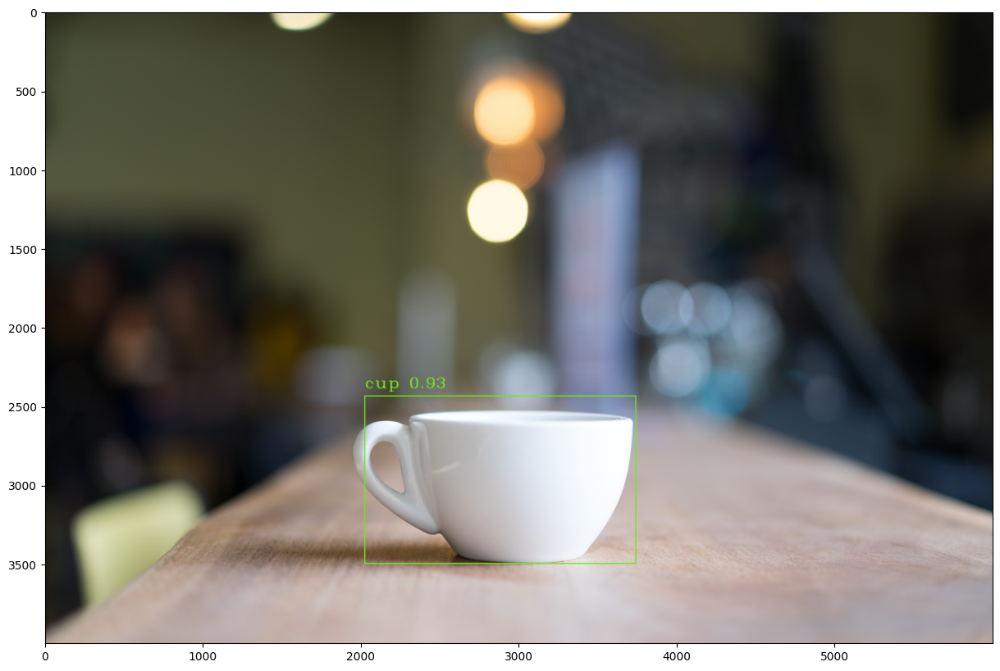

dan-gold-tlQebgkU1dI-unsplash.jpg


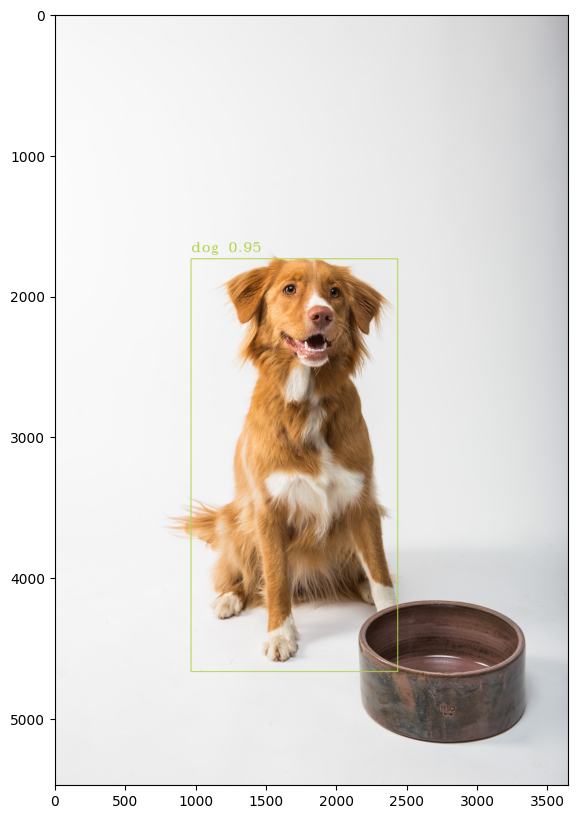

flouffy--dMO9Dm-gkU-unsplash.jpg


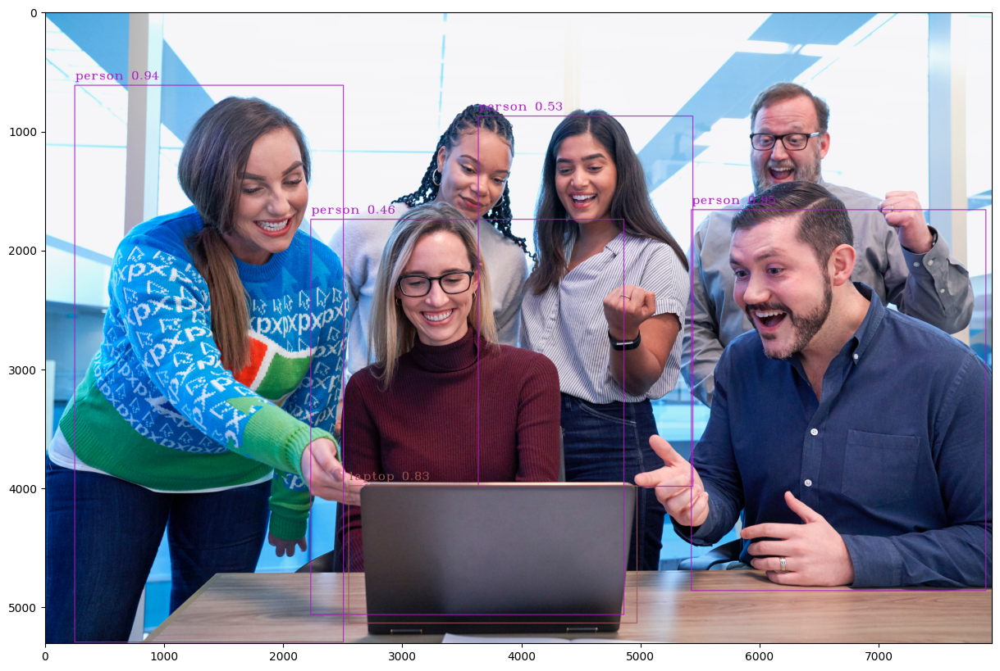

windows-p74ndnYWRY4-unsplash.jpg


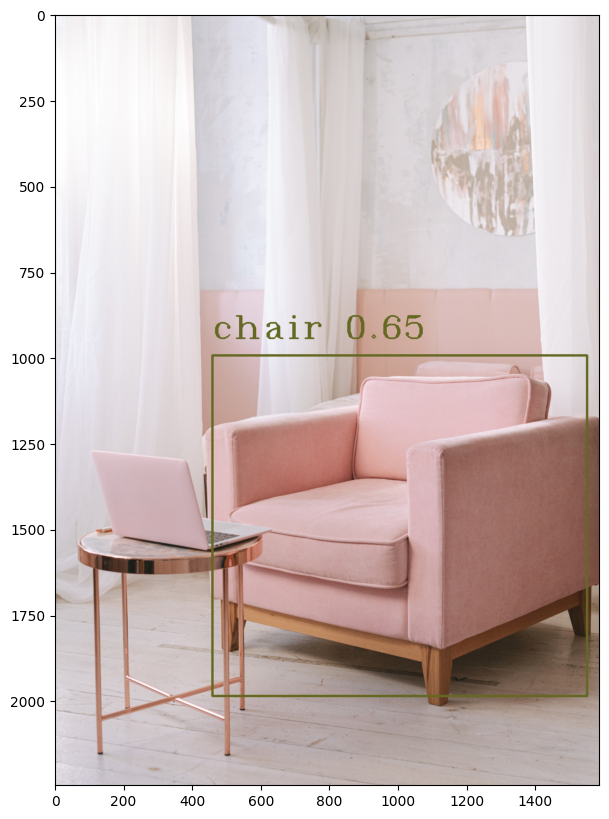

Untitled design (8).png


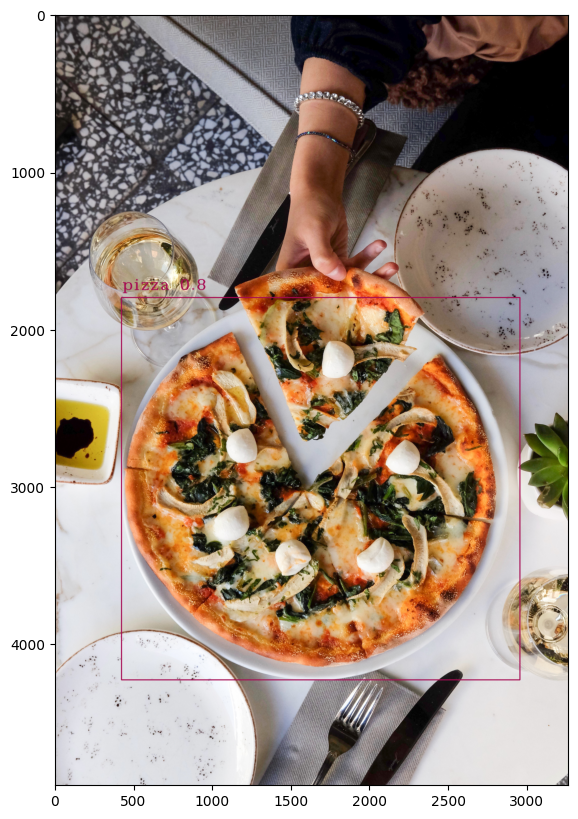

pinar-kucuk-Ae7jQFDTPk4-unsplash.jpg


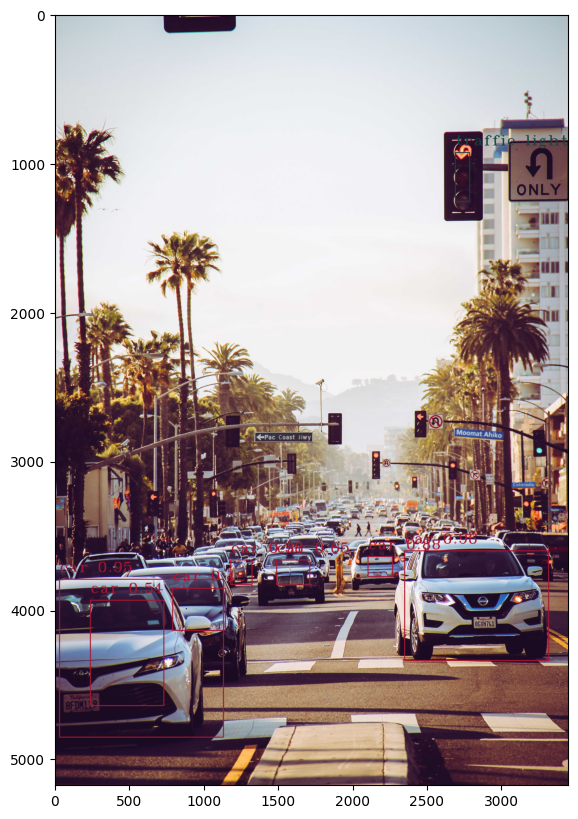

florian-wehde-yeqidtd7k1A-unsplash.jpg


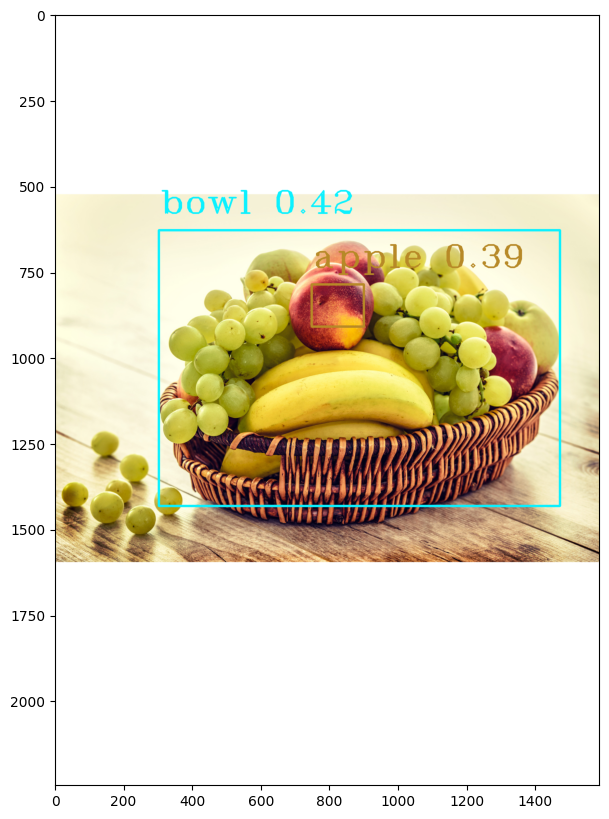

Untitled design (6).png


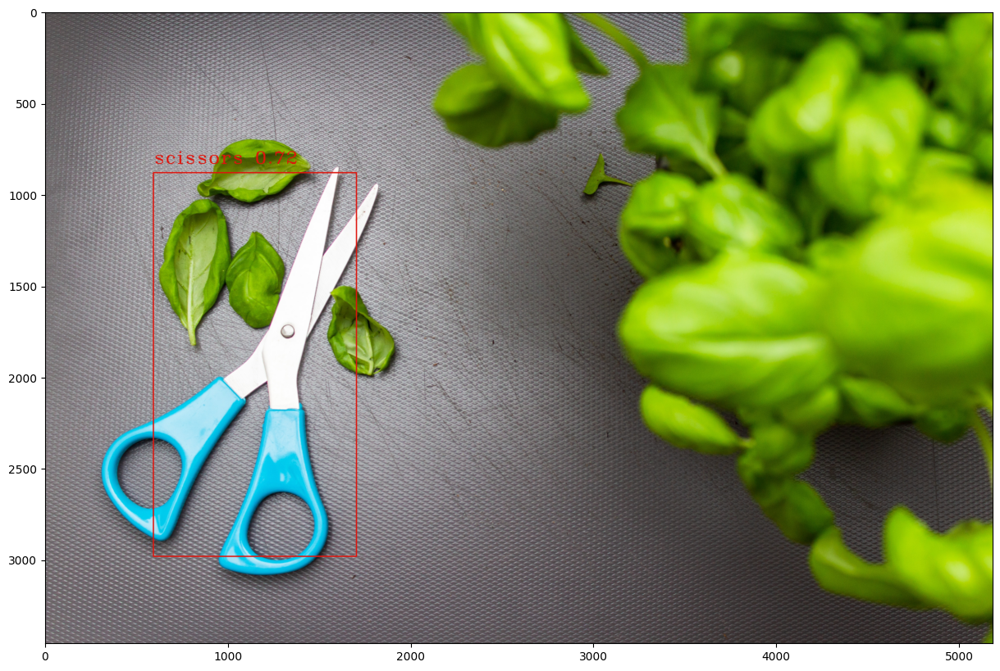

louis-hansel-wJM2-5vRJMk-unsplash.jpg


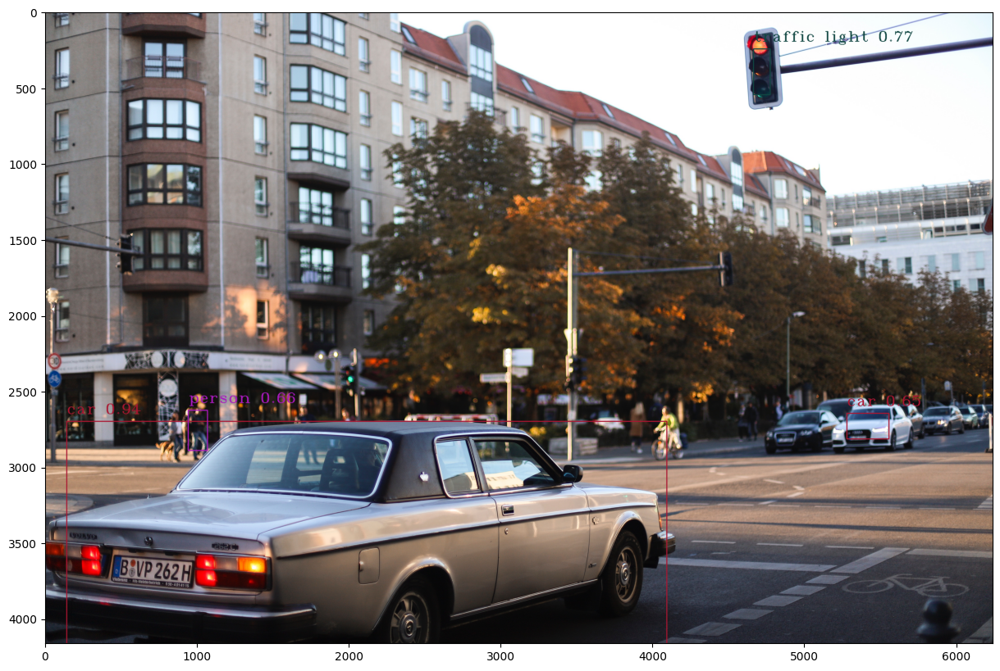

matthew-ansley-ukM5T9mJto4-unsplash.jpg


In [15]:
import os

for e in os.listdir('./test'):
    if e == '.DS_Store':
        continue
    dothings('./test/' + e)
    print(e)